# Document Denoiser

This project aims to showcase the practical use of **Autoencoders** for denoising documents while leveraging their inherent capacity for image encoding. My model, constructed using **Convolutional Neural Networks within the Autoencoder Architecture**, is trained on a dataset provided by RM.J. Castro-Bleda, S. España-Boquera, J. Pastor-Pellicer, F. Zamora-Martinez, available through the UCI machine learning repository.

**We will also explore the Vanilla Auto Encoder for the same purpose.**

**The model's objective is to remove or reduce noise found in textual documents, such as watermarks and wrinkles, and provide clean versions along with their corresponding encoded images.**

### Importing Essential Tools

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from IPython.display import display, Image
import warnings
warnings.filterwarnings("ignore")

In [3]:
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import save_model, load_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D, MaxPool2D
from keras.layers import Dense, Dropout, Flatten , BatchNormalization, Reshape
from keras.layers import Conv2DTranspose, UpSampling2D
from keras.layers import LeakyReLU
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.regularizers import l1, l2
from keras.layers import LeakyReLU

### Functions

In [4]:
def normalise(img_arr):
    '''
    Rescale pixel values to [0., 1.]
    '''
    img_arr = img_arr.astype("float32")/255
    return img_arr

def get_data_arr(gpath):
    '''
    Input 'train' or 'test' or 'train_cleaned' only, to read the images present in the folders and fetch the pixel information.
    '''
    X = []
    for num in range(300):
        path = gpath + f"/{num}.png"
        try:
            img = image.load_img(path, color_mode="grayscale", target_size=(420,540,1))
            img = image.img_to_array(img)
            X.append(img)
        except:
            continue
    X = np.array(X)
    return X

def get_img_arr(path, size=(420,540,1)):
    '''
    Input path of an image and get the numpy array of its pixel values.
    '''
    img = image.load_img(path,color_mode="grayscale",target_size=size)
    img_arr = image.img_to_array(img)
    return img_arr

def display_image(img_arr, gray=True):
    '''
    Displaying Image
    '''
    if gray:
        plt.gray()
    plt.imshow(img_arr)
    
def display(dirty_arr):
    """
    Display 3 images (420 x 540) for the provided array. 
    """
    rows = 1
    cols = 3
    fig, axis = plt.subplots(nrows= rows,ncols= cols, figsize=(16,16))
    
    for col in range(cols):
        plt.gray()
        axis[col].set_yticks([])
        axis[col].set_xticks([])
        axis[col].imshow(dirty_arr[col].reshape(420,540))
    
    plt.show()

def display_encoded(encoded_arr):
    '''
    Encoded Text Images
    '''
    rows = 1
    cols = 3
    fig, axis = plt.subplots(nrows= rows,ncols= cols, figsize=(16,16))
    for col in range(cols):
        plt.gray()
        axis[col].set_yticks([])
        axis[col].set_xticks([])
        axis[col].imshow(encoded_arr[col].reshape(210*4,270*4))   # 210,270,16
    
    plt.show
    
def psnr(y_true,y_pred):
    '''
    Peak signal to noise ratio
    '''
    max_pixel = 1.0
    mse = K.mean(K.square(y_true-y_pred))
    rmse = K.sqrt(mse)
    psnr_value = 20 * ((K.log(max_pixel/rmse))/ K.log(10.0))
    return psnr_value

def ssim(y_true,y_test):
    '''
    Structural similarity
    '''
    return tensorflow.image.ssim(y_true,y_test,max_val=1.0)

def display_custom(path,model):
    '''
    For any input image, display it along with the denoised version from the model (CNN - AE).
    '''
    img = image.load_img(path,color_mode="grayscale",target_size=(420,540,1))
    img = image.img_to_array(img)
    img = normalise(img)
    fig, axis = plt.subplots(nrows=1,ncols=2,figsize=(16,16))
    plt.gray()
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    axis[0].imshow(img)
    pred_img = model.predict(img.reshape(1,420,540,1))[0]
    axis[1].set_xticks([])
    axis[1].set_yticks([])
    axis[1].imshow(pred_img)


def display_custom_sae(path,model):
    '''
    For any input image, display it along with the denoised version from the model (SAE).
    '''
    img = image.load_img(path,color_mode="grayscale",target_size=(420,540,1))
    img = image.img_to_array(img)
    img = normalise(img)
    fig, axis = plt.subplots(nrows=1,ncols=2,figsize=(16,16))
    plt.gray()
    axis[0].imshow(img)
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    pred_img = model.predict(img.reshape(1,420*540*1))[0]
    axis[1].imshow(pred_img.reshape(420,540,1))
    axis[1].set_xticks([])
    axis[1].set_yticks([])

### Data Loading

In [5]:
dirtyX_train = normalise(get_data_arr("train"))
dirtyX_test  = normalise(get_data_arr("test"))
cleanX_train = normalise(get_data_arr("train_cleaned"))

In [6]:
dirtyX_train.shape, cleanX_train.shape

((144, 420, 540, 1), (144, 420, 540, 1))

#### In the training dataset, there are 144 images with noise in the "train" folder, and for each of these noisy images, there is a corresponding clean image in the "train_clean" folder. Each image is grayscale and has a pixel size of 420 x 540.

In [7]:
dirtyX_test.shape

(72, 420, 540, 1)

#### The test folder also contains 72 noisy images, and each of them shares the same dimensions of 420 x 540 pixels.

### Data Visualisation

<Figure size 640x480 with 0 Axes>

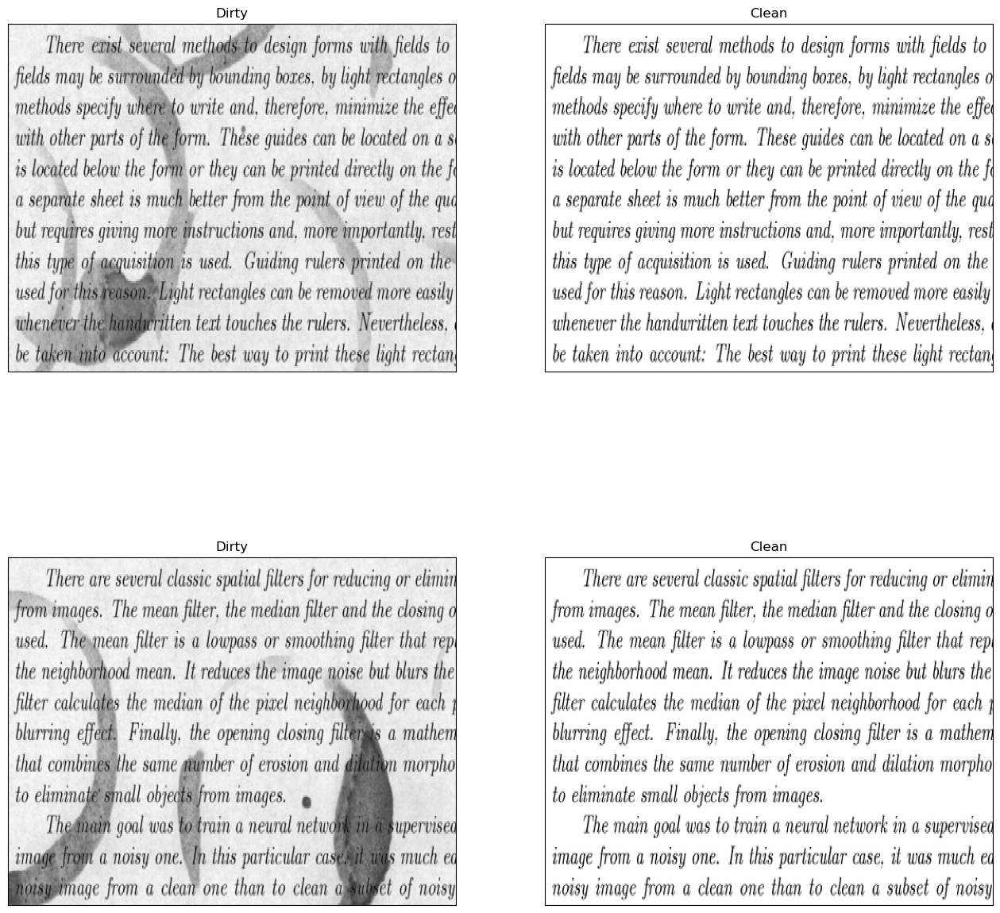

In [8]:
rows = 2
cols = 2
arr  = [dirtyX_train, cleanX_train]
count = 0
plt.gray()

fig, axis = plt.subplots(nrows=rows, ncols=cols,figsize=(16,16))

for row in range(rows):
    axis[row][0].set_title("Dirty")
    axis[row][1].set_title("Clean")
    axis[row][0].set_xticks([])
    axis[row][0].set_yticks([])
    axis[row][1].set_xticks([])
    axis[row][1].set_yticks([])
    axis[row][0].imshow(dirtyX_train[row])
    axis[row][1].imshow(cleanX_train[row])

### Modelling Convolutional Auto Encoder , Encoder and Decoder

### Suggested Model 1 - AE with CNN 

In [9]:
INPUT = Input(shape=(420,540,1))  # 420 x 540 x 1 = 226800

encoded = Conv2D(filters=32,kernel_size=(3,3),strides=(1, 1),padding='same',activation="relu",name = "Conv_Layer_1")(INPUT)     # 420,540,32
encoded = Conv2D(filters=64,kernel_size=(3,3),strides=(1, 1),padding='same',activation="relu",name = 'Conv_Layer_2')(encoded)   # 420,540,64
encoded = BatchNormalization()(encoded)
encoded = MaxPool2D(pool_size=(2, 2),padding='same',name="Max_Pool_Layer_3")(encoded)   # 210,270, 64

encoded = Conv2D(filters=16,kernel_size=(3,3),strides=(1, 1),padding='same',activation="relu",name = 'Conv_Layer_4')(encoded)    # 210,270, 16 = 113400 (bottleneck)

decoded = Conv2DTranspose(filters=64,kernel_size=(3,3),strides=(1, 1),padding='same',activation="relu",name = 'Conv_Transpose_Layer_5')(encoded)   # 210,270, 64                                                                       # 210,270, 8
decoded = Conv2DTranspose(filters=32,kernel_size=(3,3),strides=(1, 1),padding='same',activation="relu",name = 'Conv-Transpose_Layer_6')(decoded)   # 210,270, 32
decoded = UpSampling2D(size=(2, 2),name="Up_Sampling_Layer_7")(decoded)                                                                       # 420,540, 32

output = Conv2D(filters=1,kernel_size=(3,3),strides=(1, 1),padding='same',activation="sigmoid",name="Conv_Layer_8")(decoded)  # 420,540, 1       
# Sigmoid, because we scaled the pixel values to [0.,1.]

# Stacked - Auto Encoder + CNN
autoencoder1 = Model(INPUT,output)

# Encoder
encoder1 = Model(INPUT,encoded)

# Decoder
enc_input = Input(shape=(210,270,16))
dec = autoencoder1.layers[-4](enc_input)
dec = autoencoder1.layers[-3](dec)
dec = autoencoder1.layers[-2](dec)
dec = autoencoder1.layers[-1](dec)
decoder1 = Model(enc_input,dec)

# Compile
autoencoder1.compile(optimizer="rmsprop",loss="mse",metrics=["mae"])

# Callbacks
checkpointpoint_path = "a1/{epoch:03d}.h5"
callbacks_list = [EarlyStopping(monitor="val_loss",patience=10,mode="min",verbose=1), 
                  ModelCheckpoint(filepath=checkpointpoint_path,verbose=1,save_freq=30)]

In [10]:
autoencoder1.summary(), encoder1.summary(), decoder1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 Conv_Layer_1 (Conv2D)       (None, 420, 540, 32)      320       
                                                                 
 Conv_Layer_2 (Conv2D)       (None, 420, 540, 64)      18496     
                                                                 
 batch_normalization (Batch  (None, 420, 540, 64)      256       
 Normalization)                                                  
                                                                 
 Max_Pool_Layer_3 (MaxPooli  (None, 210, 270, 64)      0         
 ng2D)                                                           
                                                                 
 Conv_Layer_4 (Conv2D)       (None, 210, 270, 16)      9232  

(None, None, None)

In [11]:
history1 = autoencoder1.fit(dirtyX_train,cleanX_train,batch_size=5,epochs=200,
                callbacks=callbacks_list,
                validation_split=0.25)

Epoch 1/200
22/22 [==============================] - 32s 1s/step - loss: 0.0367 - mae: 0.1038 - val_loss: 0.0656 - val_mae: 0.2123
Epoch 2/200
 7/22 [========>.....................] - ETA: 20s - loss: 0.0109 - mae: 0.0450
Epoch 2: saving model to a1/002.h5
22/22 [==============================] - 32s 1s/step - loss: 0.0108 - mae: 0.0436 - val_loss: 0.0722 - val_mae: 0.2464
Epoch 3/200
15/22 [===================>..........] - ETA: 9s - loss: 0.0080 - mae: 0.0363 
Epoch 3: saving model to a1/003.h5
22/22 [==============================] - 32s 1s/step - loss: 0.0081 - mae: 0.0366 - val_loss: 0.0853 - val_mae: 0.2776
Epoch 4/200
22/22 [==============================] - 32s 1s/step - loss: 0.0068 - mae: 0.0335 - val_loss: 0.0427 - val_mae: 0.1510
Epoch 5/200
 1/22 [>.............................] - ETA: 30s - loss: 0.0095 - mae: 0.0357
Epoch 5: saving model to a1/005.h5
22/22 [==============================] - 33s 1s/step - loss: 0.0056 - mae: 0.0304 - val_loss: 0.0936 - val_mae: 0.2935
Epo

In [12]:
hist1 = pd.DataFrame(history1.history)
hist1.to_csv("aecnn_history.csv",index=False)

In [13]:
hist1 = pd.read_csv("aecnn_history.csv")
hist1

,loss,mae,val_loss,val_mae
0,0.036669,0.103836,0.065610,0.212347
1,0.010809,0.043559,0.072165,0.246357
2,0.008075,0.036554,0.085325,0.277593
3,0.006809,0.033487,0.042740,0.151018
4,0.005640,0.030399,0.093562,0.293473
5,0.004607,0.027651,0.069001,0.247620
6,0.005010,0.028684,0.047774,0.189625
7,0.004006,0.025512,0.034659,0.143262
8,0.004051,0.025636,0.041154,0.175280
9,0.003520,0.023668,0.024938,0.103945


In [14]:
hist1.sort_values(by="val_loss")

,loss,mae,val_loss,val_mae
34,0.001887,0.017320,0.001460,0.015778
40,0.001840,0.017117,0.001513,0.015600
41,0.001732,0.016638,0.001561,0.015612
43,0.001733,0.016464,0.001584,0.015683
39,0.001869,0.017216,0.001647,0.016455
33,0.002044,0.018007,0.001870,0.017609
31,0.002088,0.018278,0.002015,0.018881
38,0.001825,0.016968,0.002090,0.021556
35,0.001973,0.017573,0.002130,0.019557
32,0.002038,0.017934,0.002167,0.019760


In [23]:
ae1 = load_model("a1/040.h5")

In [24]:
pred1 = ae1.predict(dirtyX_test)

3/3 [==============================] - 8s 2s/step


1/1 [==============================] - 0s 84ms/step


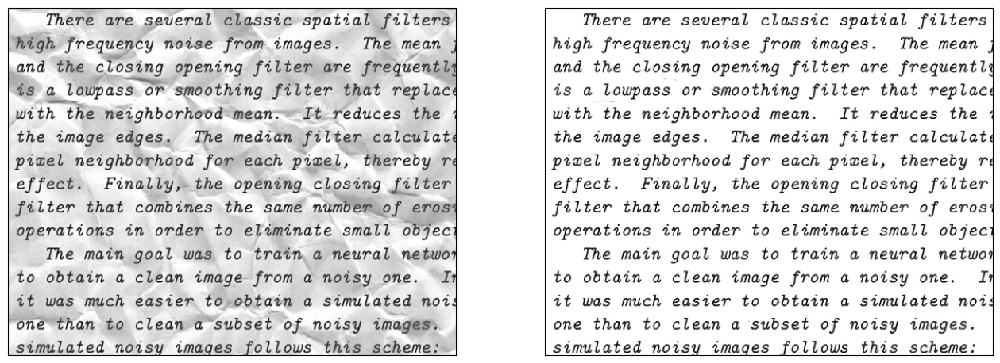

In [25]:
display_custom("train/204.png",ae1) # wrinkles

1/1 [==============================] - 0s 94ms/step


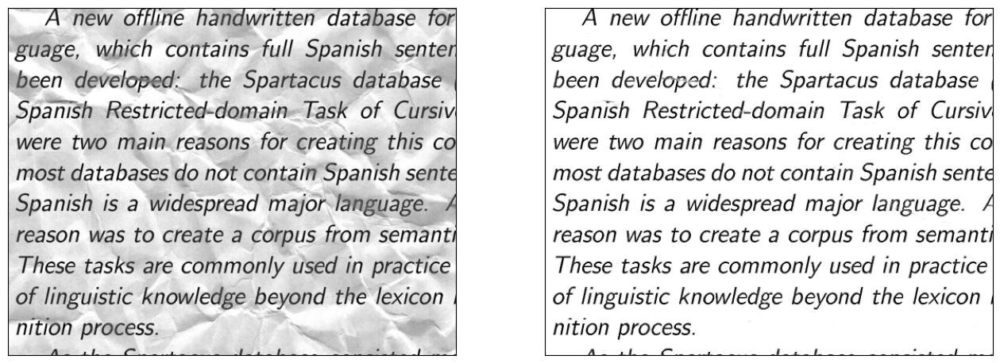

In [26]:
display_custom("test/106.png",ae1)   # wrinkles

1/1 [==============================] - 0s 93ms/step


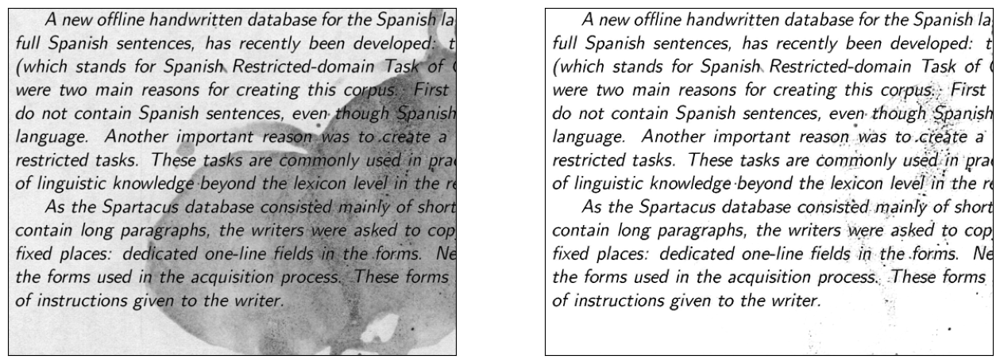

In [27]:
display_custom("test/169.png",ae1) # watermark noise

1/1 [==============================] - 0s 133ms/step


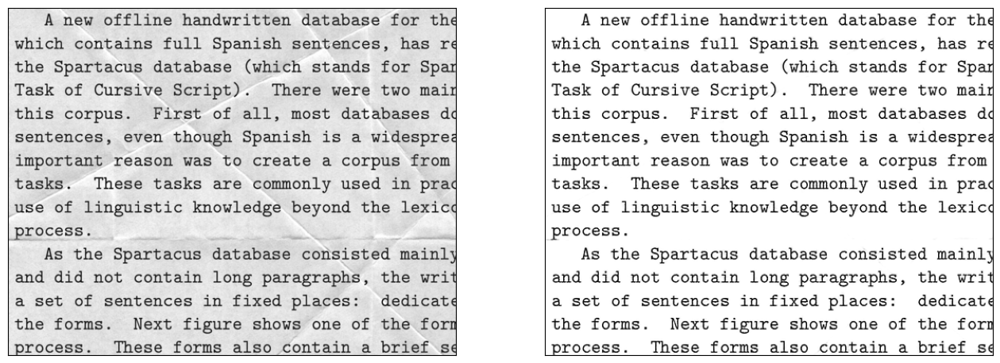

In [28]:
display_custom("test/208.png",ae1)  # crease

1/1 [==============================] - 0s 100ms/step


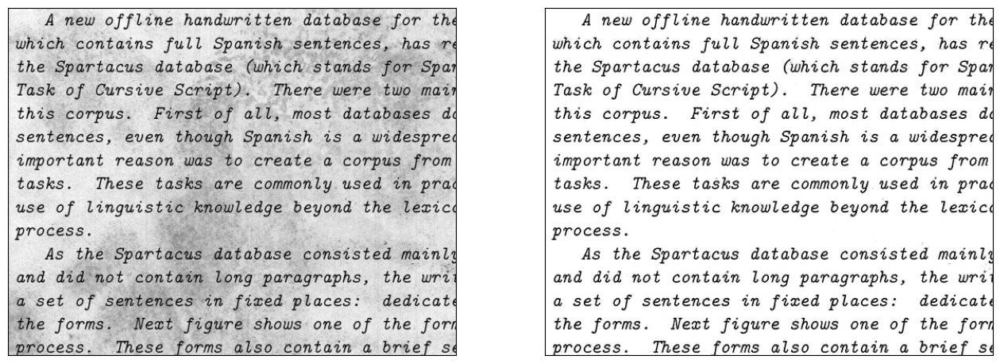

In [29]:
display_custom("test/199.png",ae1)   # stains

### Suggested Model 2 - Vanilla Auto Encoder

In [17]:
INPUT2 = Input(shape=(420 * 540 * 1,))


encoded2 = Dense(units=512)(INPUT2)
encoded2 = Dropout(0.5)(encoded2)
encoded2 = Dense(units=256, activation="relu")(encoded2)
encoded2 = Dropout(0.5)(encoded2)
encoded2 = Dense(units=128, activation="relu")(encoded2)
encoded2 = BatchNormalization()(encoded2)
# Bottleneck
bottleneck2 = Dense(units=32, activation="sigmoid")(encoded2)

decoded2 = Dense(units=128, activation="relu")(bottleneck2)
decoded2 = Dropout(0.5)(decoded2)
decoded2 = Dense(units=256, activation="relu")(decoded2)
decoded2 = Dropout(0.5)(decoded2)
decoded2 = Dense(units=512, activation="relu")(decoded2)
decoded2 = Dropout(0.5)(decoded2)
decoded2 = BatchNormalization()(decoded2)

output2 = Dense(units=420 * 540 * 1, activation="sigmoid")(decoded2)

# Stacked Sparse Autoencoder
autoencoder2 = Model(INPUT2, output2)

# Encoder model
encoder2 = Model(INPUT2, bottleneck2)

# Decoder model
enc_input2 = Input(shape=(32,))
dec2 = autoencoder2.layers[-8](enc_input2)
dec2 = autoencoder2.layers[-7](dec2)
dec2 = autoencoder2.layers[-6](dec2)
dec2 = autoencoder2.layers[-5](dec2)
dec2 = autoencoder2.layers[-4](dec2)
dec2 = autoencoder2.layers[-3](dec2)
dec2 = autoencoder2.layers[-2](dec2)
dec2 = autoencoder2.layers[-1](dec2)
decoder2 = Model(enc_input2, dec2)


# Compile
autoencoder2.compile(optimizer="adam",loss="mse",metrics=["mae"])

# Callbacks
checkpointpoint_path = "a2/{epoch:03d}.h5"
callbacks_list = [EarlyStopping(monitor="val_loss",patience=40,mode="min",verbose=1), 
                  ModelCheckpoint(filepath=checkpointpoint_path,verbose=1,save_freq=60)]

In [18]:
print(autoencoder2.summary(),encoder2.summary(),decoder2.summary())

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 226800)]          0         
                                                                 
 dense_16 (Dense)            (None, 512)               116122112 
                                                                 
 dropout_10 (Dropout)        (None, 512)               0         
                                                                 
 dense_17 (Dense)            (None, 256)               131328    
                                                                 
 dropout_11 (Dropout)        (None, 256)               0         
                                                                 
 dense_18 (Dense)            (None, 128)               32896     
                                                                 
 batch_normalization_5 (Bat  (None, 128)               512 

In [19]:
history2 = autoencoder2.fit(dirtyX_train.reshape(len(dirtyX_train),420 * 540 * 1),cleanX_train.reshape(len(cleanX_train),420 * 540 * 1),batch_size=20,epochs=600,
                callbacks=callbacks_list,
                validation_split=0.25)

Epoch 1/600
6/6 [==============================] - 8s 1s/step - loss: 0.2226 - mae: 0.4581 - val_loss: 0.2232 - val_mae: 0.4592
Epoch 2/600
6/6 [==============================] - 4s 592ms/step - loss: 0.2221 - mae: 0.4577 - val_loss: 0.2227 - val_mae: 0.4587
Epoch 3/600
6/6 [==============================] - 3s 452ms/step - loss: 0.2216 - mae: 0.4571 - val_loss: 0.2220 - val_mae: 0.4580
Epoch 4/600
6/6 [==============================] - 3s 367ms/step - loss: 0.2208 - mae: 0.4564 - val_loss: 0.2213 - val_mae: 0.4573
Epoch 5/600
6/6 [==============================] - 4s 596ms/step - loss: 0.2200 - mae: 0.4556 - val_loss: 0.2204 - val_mae: 0.4563
Epoch 6/600
6/6 [==============================] - 4s 677ms/step - loss: 0.2191 - mae: 0.4546 - val_loss: 0.2191 - val_mae: 0.4551
Epoch 7/600
6/6 [==============================] - 6s 1s/step - loss: 0.2179 - mae: 0.4534 - val_loss: 0.2175 - val_mae: 0.4534
Epoch 8/600
6/6 [==============================] - 5s 776ms/step - loss: 0.2160 - mae: 0.

In [20]:
hist2 = pd.DataFrame(history2.history)
hist2.to_csv("sae_history.csv",index=False)

In [21]:
hist2 = pd.read_csv("sae_history.csv")
hist2

,loss,mae,val_loss,val_mae
0,0.222573,0.458139,0.223241,0.459246
1,0.222143,0.457708,0.222685,0.458685
2,0.221554,0.457117,0.222045,0.458039
3,0.220833,0.456387,0.221285,0.457271
4,0.220006,0.455551,0.220351,0.456326
...,...,...,...,...
68,0.062753,0.161952,0.080029,0.185220
69,0.062743,0.161786,0.079971,0.183665
70,0.062632,0.161459,0.079957,0.182559
71,0.062743,0.161855,0.080042,0.181857


In [22]:
hist2.sort_values(by="val_loss")

,loss,mae,val_loss,val_mae
32,0.064343,0.183781,0.078687,0.196118
33,0.064366,0.181956,0.078716,0.195718
31,0.064761,0.186642,0.078734,0.197637
34,0.063926,0.179533,0.078784,0.196371
30,0.064856,0.189187,0.078859,0.199904
...,...,...,...,...
4,0.220006,0.455551,0.220351,0.456326
3,0.220833,0.456387,0.221285,0.457271
2,0.221554,0.457117,0.222045,0.458039
1,0.222143,0.457708,0.222685,0.458685


In [30]:
ae2 = load_model("a2/060.h5")

In [31]:
pred2 = ae2.predict(dirtyX_test.reshape(len(dirtyX_test),420*540*1))

3/3 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 39ms/step


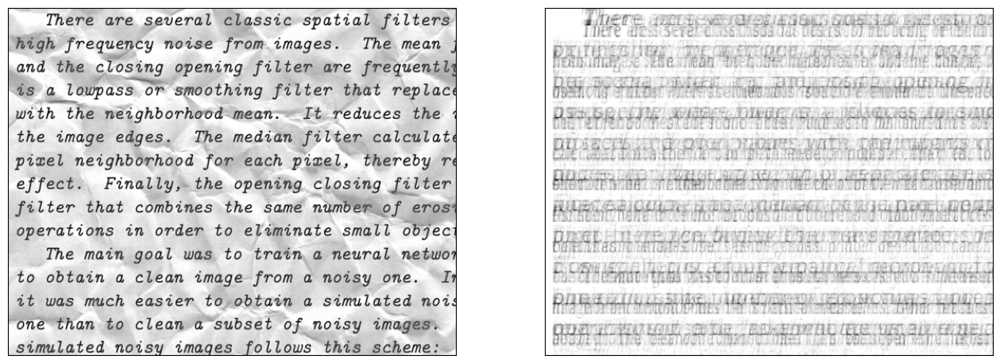

In [32]:
display_custom_sae("train/204.png",ae2) # wrinkles

1/1 [==============================] - 0s 42ms/step


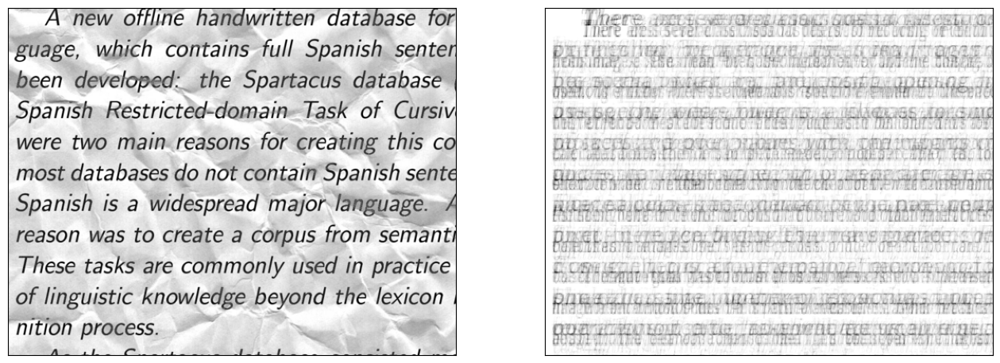

In [33]:
display_custom_sae("test/106.png",ae2) # wrinkles

### Comparing Histories

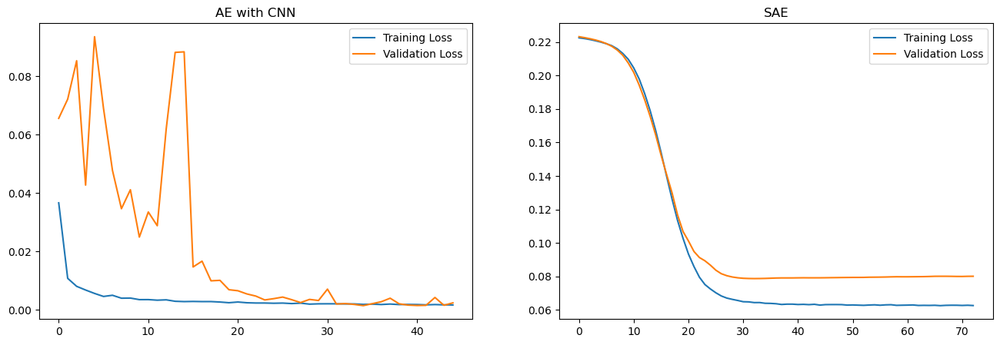

In [34]:
rows = 1
cols = 2
hist = [hist1, hist2]
title = ["AE with CNN", "SAE"]
fig , axis = plt.subplots(nrows=rows, ncols=cols, figsize=(16,5))

for i in range(len(hist)):
    modelhist = hist[i]
    axis[i].set_title(title[i])
    axis[i].plot(modelhist["loss"], label = "Training Loss")
    axis[i].plot(modelhist["val_loss"], label = "Validation Loss")
    axis[i].legend()

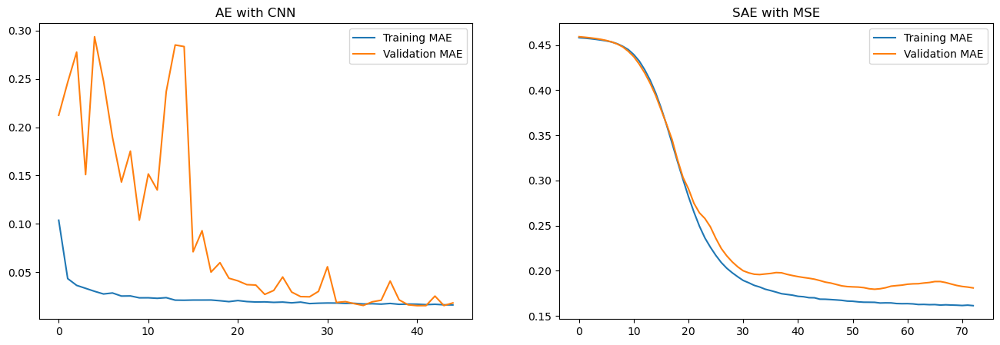

In [35]:
rows = 1
cols = 2
hist = [hist1, hist2]
title = ["AE with CNN", "SAE with MSE", "SAE with BinaryCrossEntropy"]
fig , axis = plt.subplots(nrows=rows, ncols=cols, figsize=(16,5))

for i in range(len(hist)):
    modelhist = hist[i]
    axis[i].set_title(title[i])
    axis[i].plot(modelhist["mae"], label = "Training MAE")
    axis[i].plot(modelhist["val_mae"], label = "Validation MAE")
    axis[i].legend()

#### From the suggested models, our first proposed models, i.e, Autoencoder using CNNs in the architecture outperforms the Simple Autoencoders with ANNs.

### Model 1 : Autoencoder with CNN

In [36]:
ae1.layers

In [37]:
encoder1.layers

In [38]:
decoder1.layers

In [40]:
for layer in range(6):
    encoder1.layers[layer].set_weights(ae1.layers[layer].get_weights())

decoder1.layers[1].set_weights(ae1.layers[6].get_weights())
decoder1.layers[2].set_weights(ae1.layers[7].get_weights())
decoder1.layers[3].set_weights(ae1.layers[8].get_weights())
decoder1.layers[4].set_weights(ae1.layers[9].get_weights())

In [41]:
save_model(ae1,"autoencoder.h5")
save_model(encoder1,"encoder.h5")
save_model(decoder1,"decoder.h5")

In [42]:
ae = load_model("autoencoder.h5")
encoder = load_model("encoder.h5")
decoder = load_model("decoder.h5")

### Displaying Dirty, Encoded, Decoded Representations for Training Set along with Expected Output (Clean Train)


* Dirty Image 
* Encoded Image (113400 dimensions)  (half of dirty image)
* Decoded Representation
* Expected Clean Output

In [43]:
ae_predtrain  = ae.predict(dirtyX_train)          # decoded representations from autoencoder
enc_predtrain = encoder.predict(dirtyX_train)     # encoded representations from encoder
dec_predenc   = decoder.predict(enc_predtrain)    # decoded representations using encoder input and decoder; same as autoencoder's output with train input

5/5 [==============================] - 4s 729ms/step


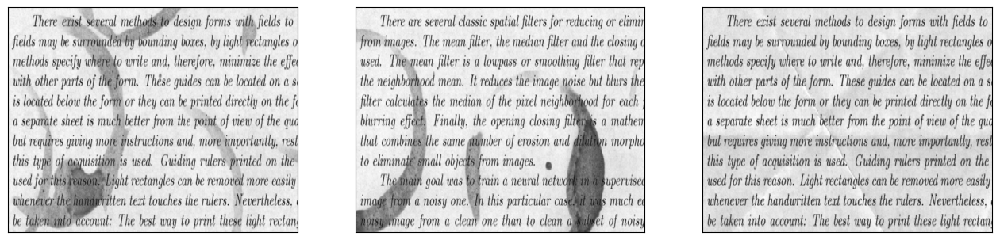

Dirty Images
Encoded Images


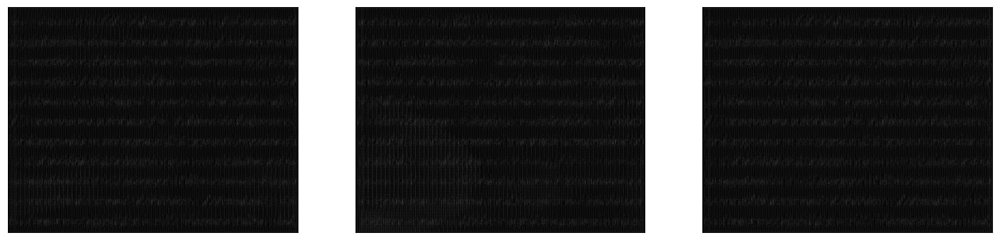

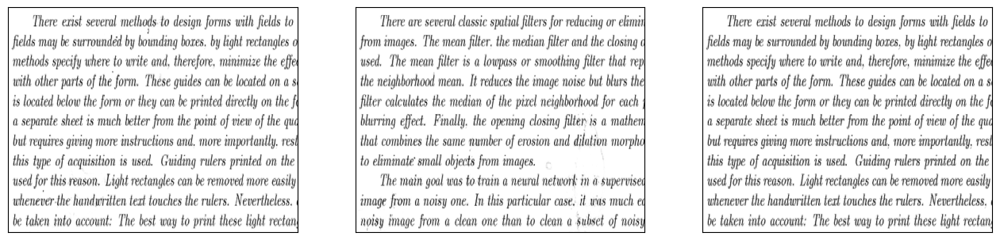

Denoised Images


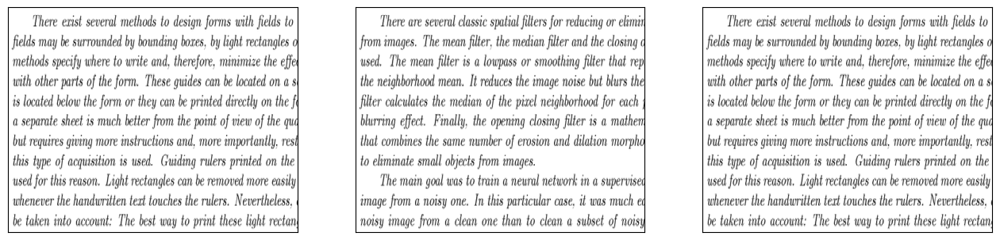

Expected Clean Images


In [47]:
display(dirtyX_train);
print("Dirty Images")
display_encoded(enc_predtrain);
print("Encoded Images")
display(ae_predtrain);
print("Denoised Images");
display(cleanX_train);
print("Expected Clean Images");

Denoised / Decoded Images using Decoder


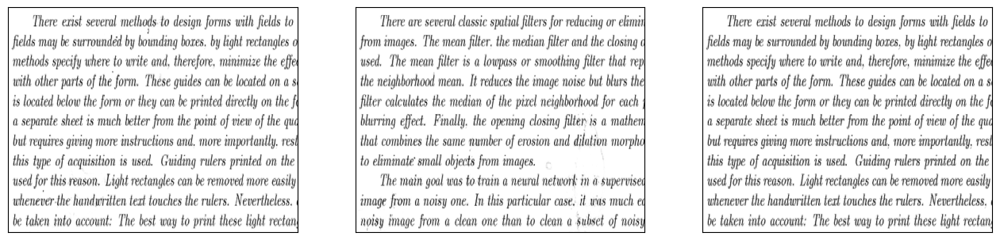

In [46]:
print("Denoised / Decoded Images using Decoder")
display(dec_predenc);

### Displaying Dirty, Encoded, Decoded Representations for Test Set 


* Dirty Image 
* Encoded Image (113400 dimensions)  (half of dirty image)
* Decoded Representation

In [49]:
ae_predtest  = ae.predict(dirtyX_test)          # decoded representations from autoencoder
enc_predtest = encoder.predict(dirtyX_test)     # encoded representations from encoder
dec_pred_enc_test   = decoder.predict(enc_predtest)    # decoded representations using encoder input and decoder; same as autoencoder's output with test input

3/3 [==============================] - 2s 508ms/step


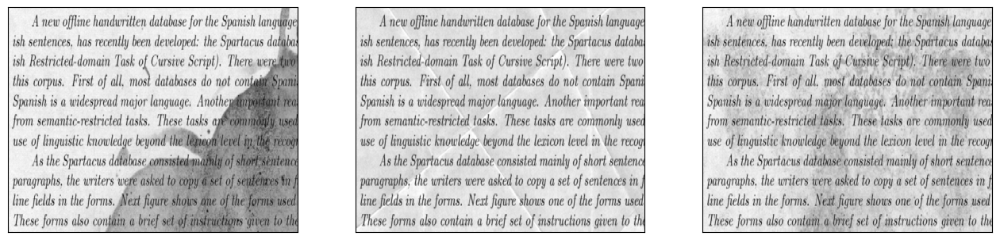

Dirty Images
Encoded Images


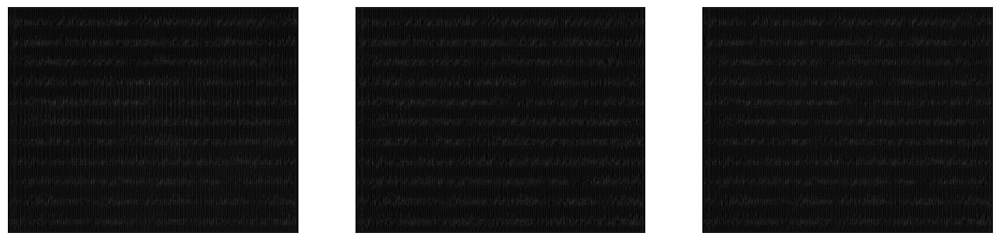

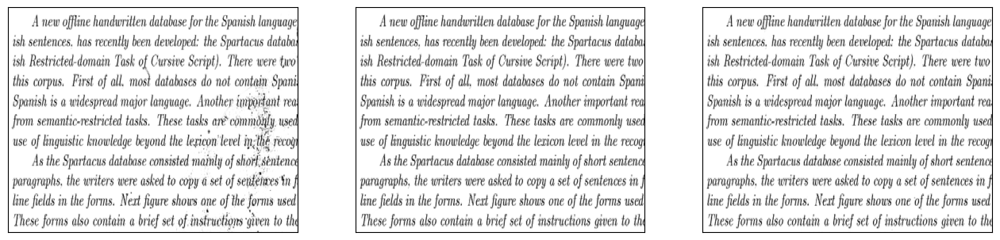

Denoised Images


In [50]:
display(dirtyX_test);
print("Dirty Images")
display_encoded(enc_predtest);
print("Encoded Images")
display(ae_predtest);
print("Denoised Images");

Denoised / Decoded Images using Decoder


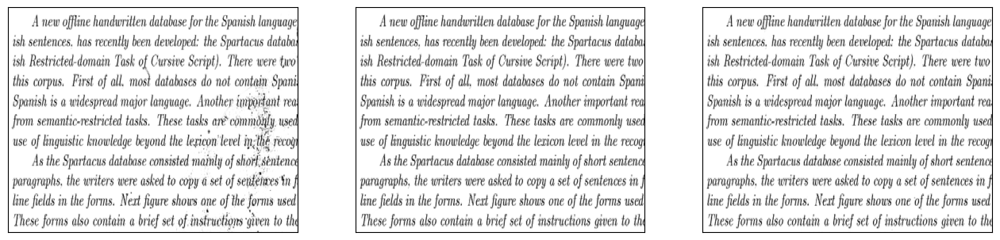

In [51]:
print("Denoised / Decoded Images using Decoder")
display(dec_pred_enc_test);

### More Random Examples from the Test Set

1/1 [==============================] - 0s 71ms/step


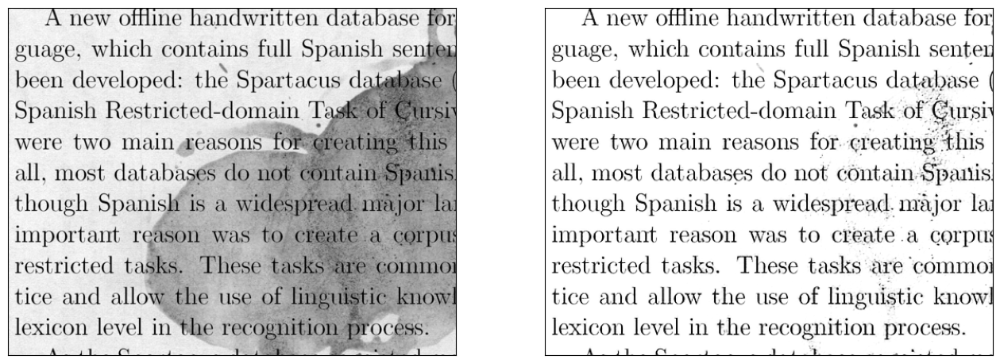

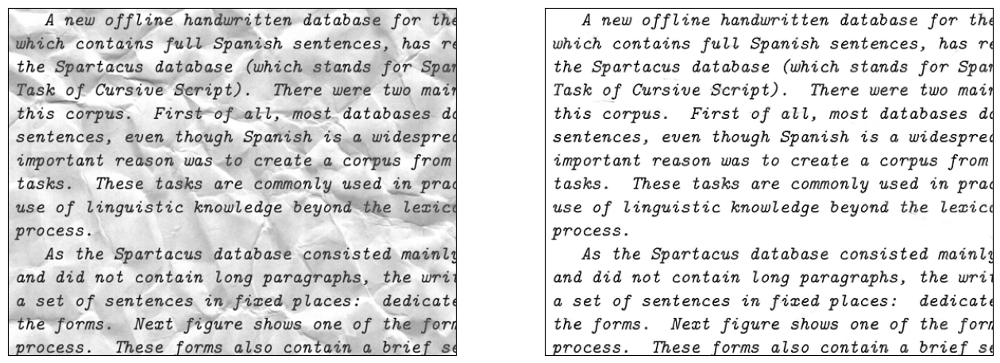

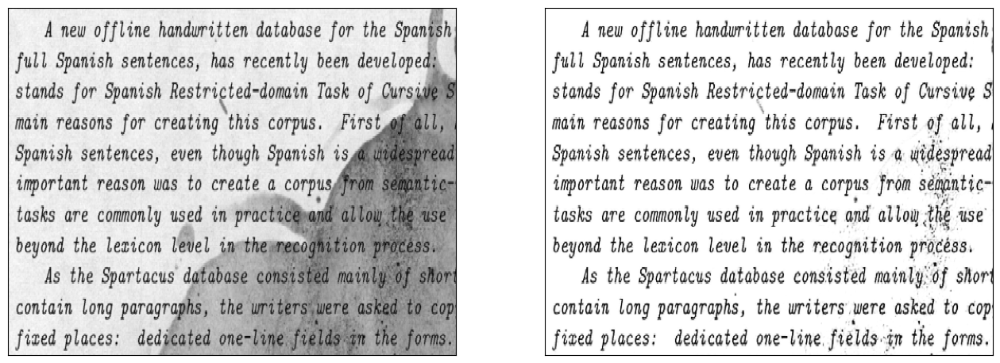

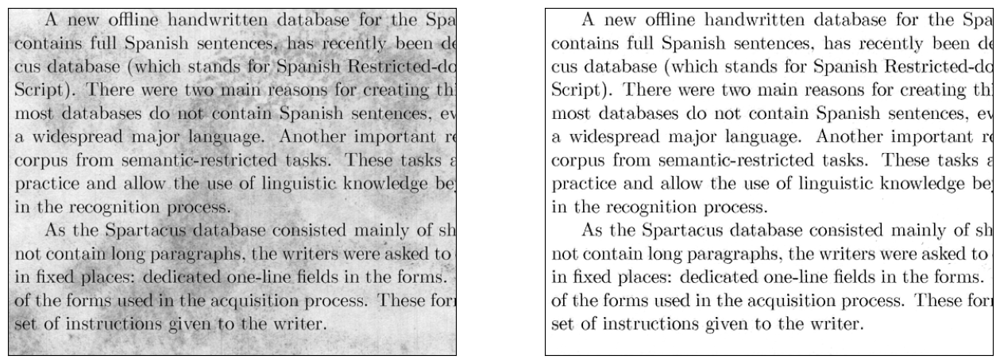

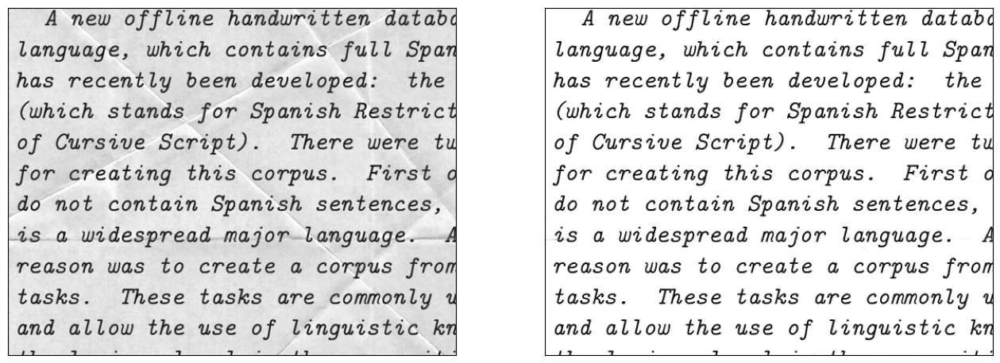

In [52]:
display_custom("test/85.png",ae)
display_custom("test/202.png",ae)
display_custom("test/49.png",ae)
display_custom("test/163.png",ae)
display_custom("test/124.png",ae)

### Random Images Downloaded From Internet

1/1 [==============================] - 0s 70ms/step


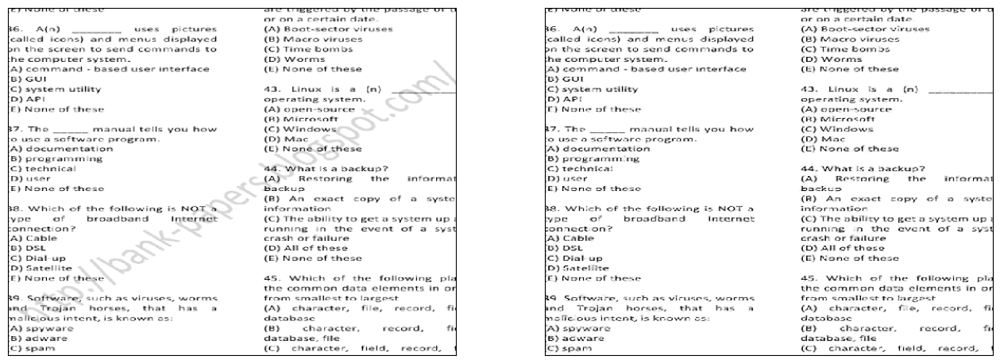

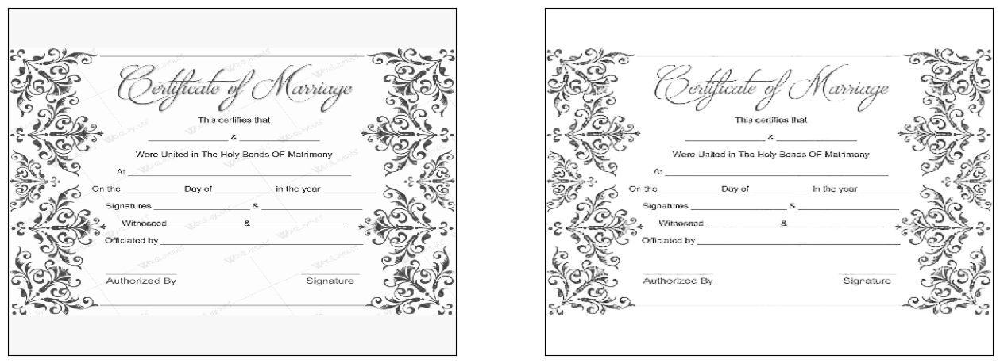

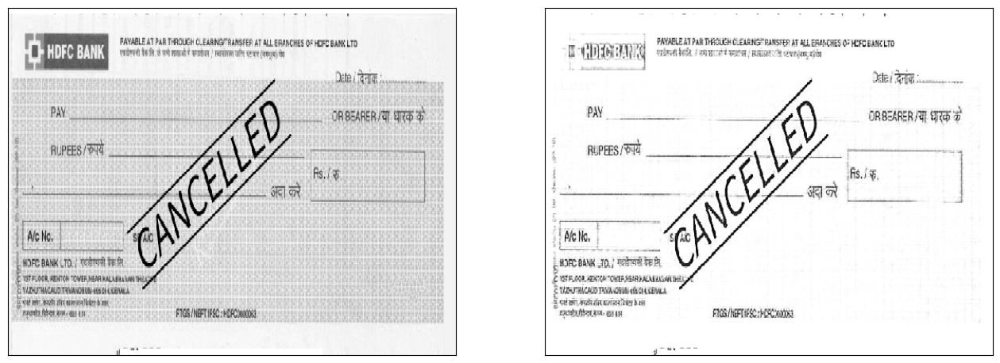

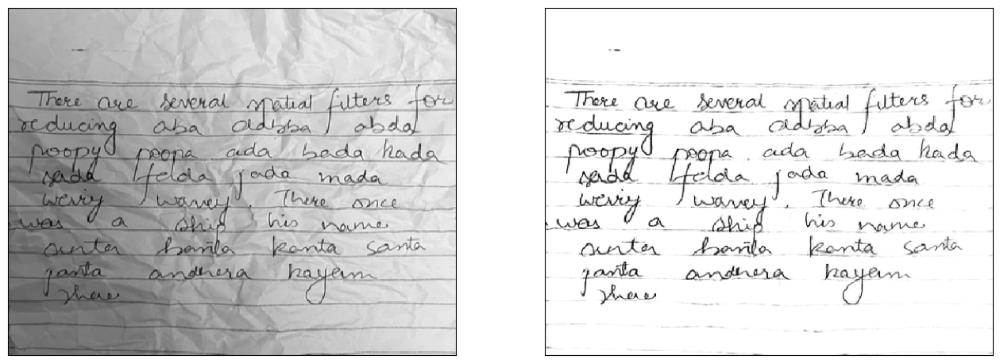

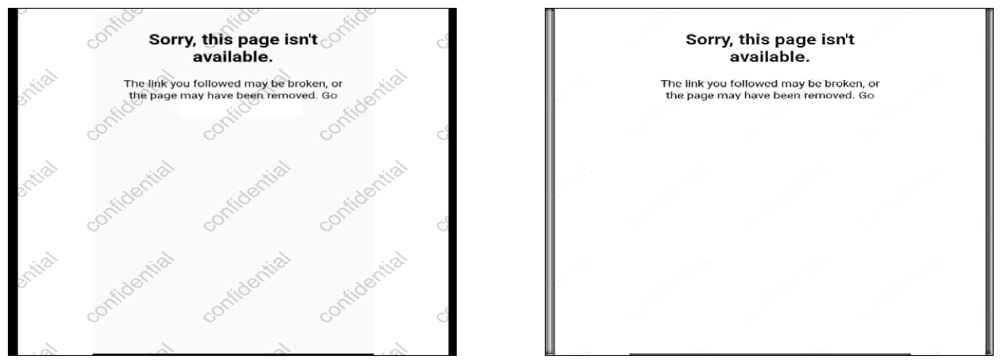

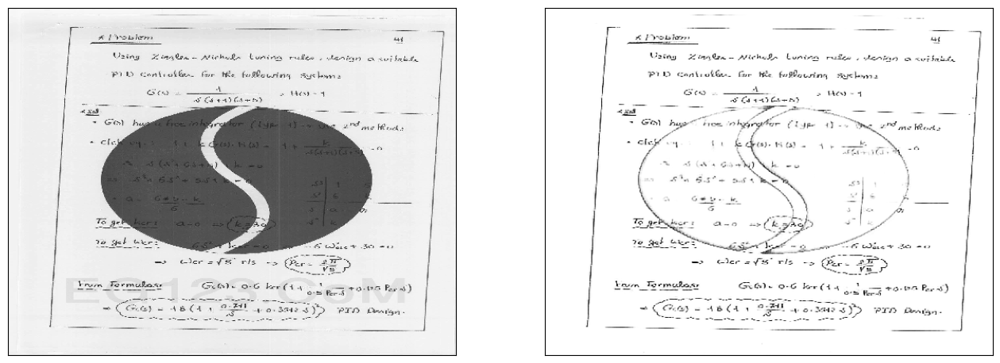

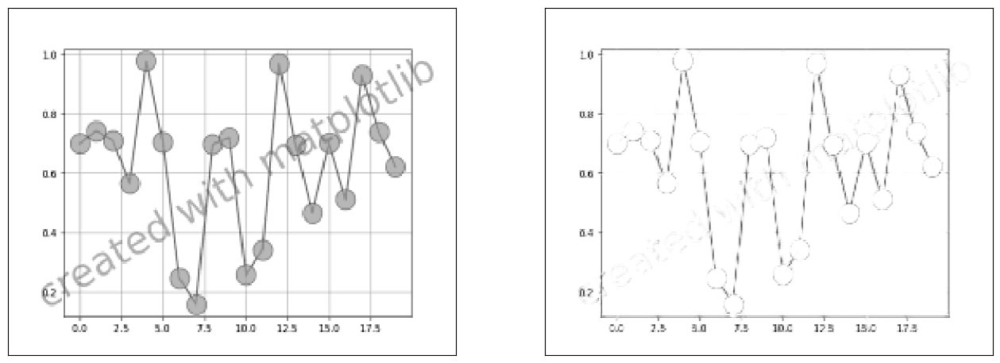

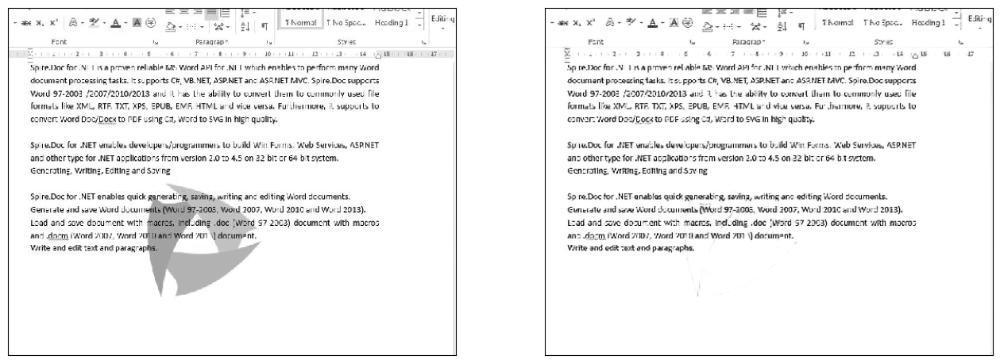

In [54]:
display_custom("img1.png",ae)
display_custom("img2.png",ae)
display_custom("img3.png",ae)
display_custom("img4.png",ae)
display_custom("img5.jpeg",ae)
display_custom("img6.png",ae)
display_custom("img7.png",ae)
display_custom("img8.jpg",ae)

# Deployment Using Gradio

In [55]:
import gradio as gr
import cv2

In [59]:
def denoise_image(img):
    img = image.img_to_array(img).astype("int")

    r, g, b = img[:,:,0], img[:,:,1], img[:,:,2]
    
    # Luminosity method: 0.21 R + 0.72 G + 0.07 B
    gimg = 0.21 * r + 0.72 * g + 0.07 * b
    gimg = gimg.astype("float32")/255

    i = cv2.resize(gimg, (540, 420), interpolation=cv2.INTER_NEAREST)
    
    p = ae.predict(i.reshape(1,420,540,1))[0]
    
    c = cv2.cvtColor(p, cv2.COLOR_GRAY2BGR)
    
    c = (c*255).astype("int")
    
    return c

# Create a Gradio interface
iface = gr.Interface(
    fn=denoise_image,
    inputs=gr.Image(),  # Input image with specified shape
    outputs=gr.Image()  # Output denoised image
)

# Launch the Gradio interface
iface.launch()

Running on local URL:  http://127.0.0.1:7863

To create a public link, set `share=True` in `launch()`.
